# Milestone 2 - Implementation

In [1]:
# importing libraries 
import pandas as pd
import altair as alt
from altair import datum
#alt.data_transformers.enable("default") 
alt.renderers.enable("mimetype")
import warnings
warnings.filterwarnings("ignore")

In [2]:
# reading in dataset
penguins = pd.read_csv('data/penguins_merged.csv')
penguins_subset = pd.read_csv('data/penguins_subset.csv')
penguins.head()

,species,island,bill length mm,bill depth mm,flipper length mm,body mass g,sex,diet,life stage,health metrics,year,delta 15 n (o/oo),delta 13 c (o/oo)
0,Adelie,Biscoe,53.4,17.8,219.0,5687.0,female,fish,adult,overweight,2021,8.43951,-25.88156
1,Adelie,Biscoe,49.3,18.1,245.0,6811.0,female,fish,adult,overweight,2021,8.84451,-26.55602
2,Adelie,Biscoe,55.7,16.6,226.0,5388.0,female,fish,adult,overweight,2021,8.41837,-25.19837
3,Adelie,Biscoe,38.0,15.6,221.0,6262.0,female,fish,adult,overweight,2021,8.80967,-25.36288
4,Adelie,Biscoe,60.7,17.9,177.0,4811.0,female,fish,juvenile,overweight,2021,8.08138,-25.81012


## Task A - 

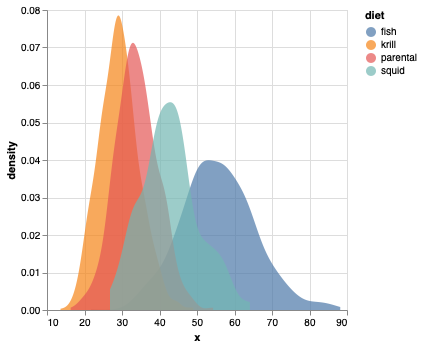

In [86]:
life_stages = ['chick', 'juvenile', 'adult']
labels = ['Chick', 'Juvenille', 'Adult']
stage_radio = alt.binding_radio(
    options=life_stages, labels=labels, name='Life Stage: ')

selection = alt.selection_point(
    fields=['life stage'], 
    bind=stage_radio
)

metric_options = ['bill length mm', 'bill depth mm', 'flipper length mm']
metric_labels = ['Bill Length', 'Bill Depth', 'Flipper Length']
metric_dropdown = alt.binding_select(options=metric_options, 
                                     labels=metric_labels, 
                                     name='Metric Displayed: ')
xcol_param = alt.param(value='bill length mm', 
                       bind=metric_dropdown)
metric_selection = alt.selection_point(fields=metric_options, 
                                       bind=metric_dropdown)
dropdown = alt.binding_select(
    options=['bill length mm', 'bill depth mm', 'flipper length mm'],
    name='Metric Selected :'
)
xcol_param = alt.param(
    value='bill length mm',
    bind=dropdown
)

density_plot = alt.Chart(penguins).transform_filter(
    selection
).transform_calculate(
    x=f'datum[{xcol_param.name}]'
).transform_density(
    'x', 
    as_=['x', 'density'], 
    groupby=['diet']
).mark_area(
    opacity=0.7).encode(
    x=alt.X('x:Q'), 
    y=alt.Y('density:Q'), 
    color=alt.Color('diet:N')
).add_params(
    xcol_param, 
    selection
)

density_plot

## Task B - 

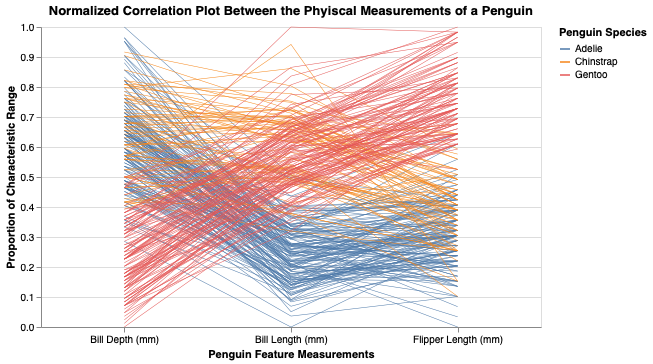

In [98]:
parallel_coord_plot_selection = alt.selection_point(fields=['species'], bind='legend', )

parallel_coord_plot = alt.Chart(penguins_subset, width=500).transform_window(
    index='count()'
).transform_fold(
    ['bill length mm', 'bill depth mm', 'flipper length mm']
).transform_joinaggregate(
    min='min(value)',
    max='max(value)',
    groupby=['key']
).transform_calculate(
    minmax_value=(datum.value - datum.min) / (datum.max - datum.min),
    mid=(datum.min + datum.max) / 2,
).mark_line().encode(
    x=alt.X('key:N', title='Penguin Feature Measurements', 
            axis=alt.Axis(labelAngle=0, 
                          labelExpr = "datum.label === 'bill length mm' ? 'Bill Length (mm)' : (datum.label === 'bill depth mm' ? 'Bill Depth (mm)' : 'Flipper Length (mm)')")),
    y=alt.Y('minmax_value:Q', title='Proportion of Characteristic Range'),
    color=alt.Color('species', title='Penguin Species').legend(),
    detail='index:N',
    opacity=alt.condition(parallel_coord_plot_selection, alt.value(1), alt.value(0.1)),
    size=alt.value(0.5)
).add_selection(
    parallel_coord_plot_selection
).properties(title = "Normalized Correlation Plot Between the Phyiscal Measurements of a Penguin")

# parallel_coord_plot_text = alt.Chart(penguins_subset).mark_text(
parallel_coord_plot

## Task C -

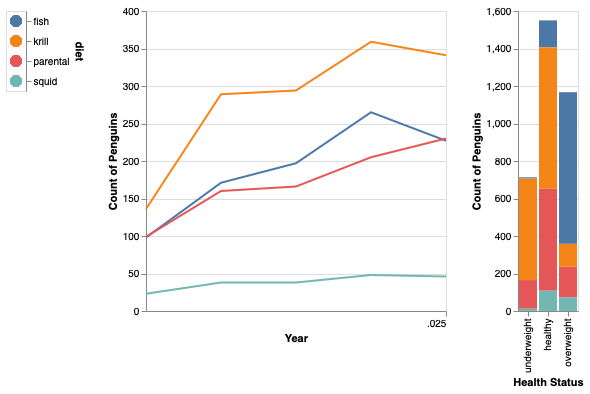

In [85]:
diets = ['fish', 'krill', 'parental', 'squid']
diets_label = ['Fish', 'Krill', 'Parental', 'Squid']
stage_radio = alt.binding_radio(
    options=life_stages, labels=labels, name='Life Stage: ')

diet_selection = alt.selection_point(
    fields=['diet']
)
color = alt.condition(
    diet_selection,
    alt.Color('diet:N').legend(None),
    alt.value('lightgray')
)

bar_color =  alt.condition(
    diet_selection,
    alt.Color('diet:N'),
    alt.value('black'))
    
diet_legend = alt.Chart(penguins).mark_circle(
    size=125).encode(
    alt.Y('diet:N').axis(orient='right'), 
    color=color
).add_params(
    diet_selection
)
health_options = ['underweight', 'healthy', 'overweight']
health_labels = ['Underweight', 'Healthy', 'Overweight']
health_radio = alt.binding_radio(
    options=health_options, labels=health_labels, name='Health Status: ')

health_selection = alt.selection_point(
    fields=['health metrics'], 
    bind=health_radio
)

bar_chart = alt.Chart(penguins).mark_bar().encode(
    x=alt.X('health metrics:O', sort=['underweight', 'healthy', 'overweight'], title='Health Status'), 
    y = alt.Y('count()', scale=alt.Scale(domain=[0, 1600]), title='Count of Penguins'), 
    color=bar_color
    ).transform_filter(diet_selection
                   ).add_params(diet_selection)

line_chart = alt.Chart(penguins).mark_line().encode(
    x = alt.X('year:T', title='Year'), 
    y = alt.Y('count()', title='Count of Penguins'), 
    color = color, 
    tooltip = ['count()']
)
diet_legend | line_chart | bar_chart 

## Task D - 

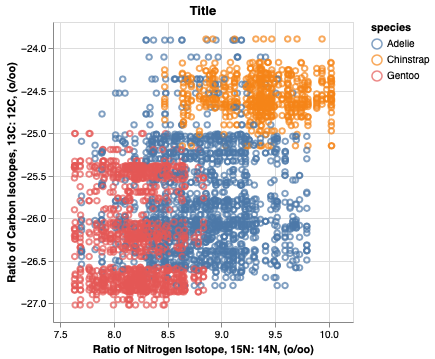

In [80]:
scatterplot_selection = alt.selection_interval()

scatterplot = alt.Chart(penguins).mark_point().encode(
    x = alt.X('delta 15 n (o/oo)').scale(domain = [penguins['delta 15 n (o/oo)'].min()-0.2,penguins['delta 15 n (o/oo)'].max()+0.2]).title('Ratio of Nitrogen Isotope, 15N: 14N, (o/oo)'),
    y = alt.Y('delta 13 c (o/oo)').scale(domain = [penguins['delta 13 c (o/oo)'].min()-0.2,penguins['delta 13 c (o/oo)'].max()+0.2]).title('Ratio of Carbon Isotopes, 13C: 12C, (o/oo)'),
    color=alt.condition(scatterplot_selection, 'species', alt.value('lightgray'))
).add_selection(
    scatterplot_selection
).properties(
    title = 'Title'
)

scatterplot

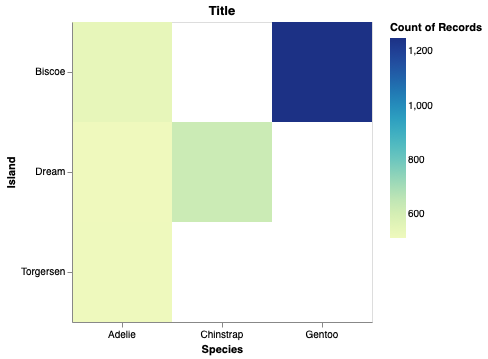

In [81]:
heatmap_selection = alt.selection_multi(encodings = ['x', 'y'])
heatmap = alt.Chart(penguins).mark_rect().encode(
    x = alt.X('species', axis = alt.Axis(labelAngle=0)).title('Species'),
    y = alt.Y('island').title('Island'),
    color = alt.condition(heatmap_selection, 'count()', alt.value('lightgrey'))
).add_selection(
    heatmap_selection
).properties(
    height = 300,
    width = 300,
    title = 'Title'
)
heatmap

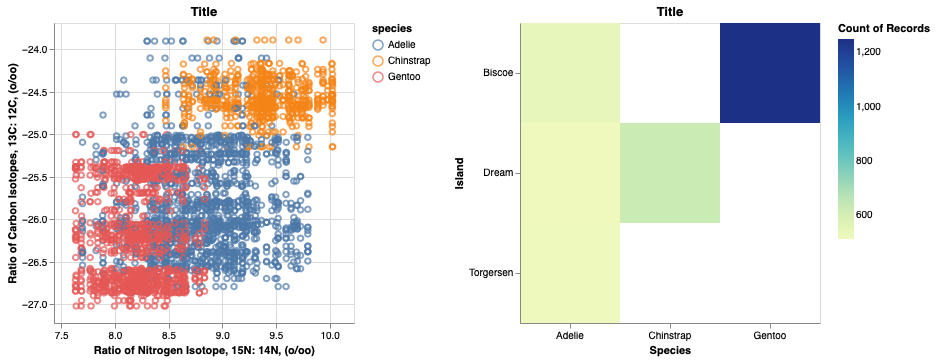

In [82]:
scatter_heatmap_plot = scatterplot.transform_filter(heatmap_selection) | heatmap.transform_filter(scatterplot_selection)
scatter_heatmap_plot

## Dashboard

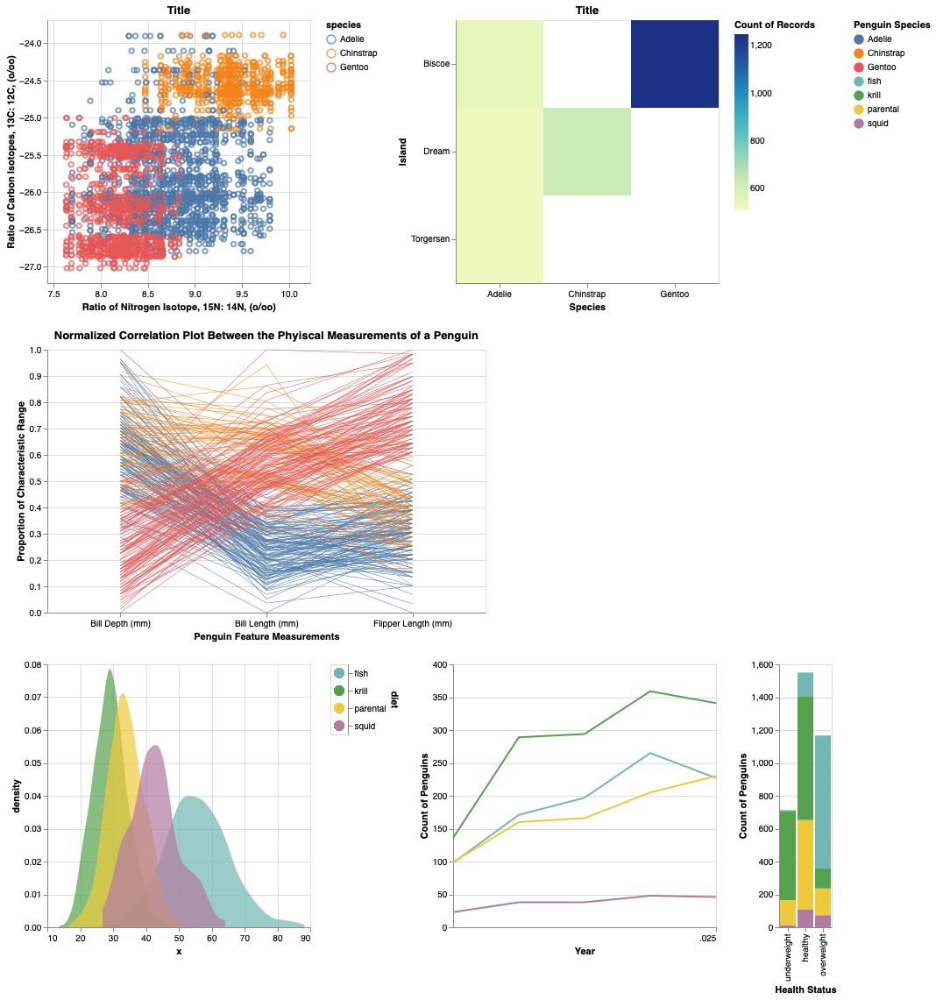

In [103]:
row1 = density_plot | (diet_legend | line_chart | bar_chart)
row2 = parallel_coord_plot
row3 = scatter_heatmap_plot

dashboard = (row3 & row2) & row1
dashboard